# Data Cleaning, Transforming and Pre-processing

Often times, it is a luxury to have a fully structured dataset with you. Normally data comes in a very messy format and then a lot of time goes by trying to clean the data to make it ready for analysis. This session we will focus on doing just that. We will start with finding out missing and duplicates in the dataset, and then deciding what to do with the data, and then figuring out the outliers, and then try to transform the dataset to different formats for our benefit

First lets start by loading the necessary libraries

In [1]:
# Importing pandas to load and work with dataset
import pandas as pd

# Importing sys to install libraries
import sys

# Importing numpy for numeric calculations if we need them
import numpy as np

# Preparing pandas for visualization
pd.plotting.register_matplotlib_converters()

# Importing the matplotlib library to do the plotting
import matplotlib.pyplot as plt

# Settig the jupyter notebook so that plots are auto printed
%matplotlib inline

# Importing seaborn for easier plotting
import seaborn as sns

Next we load the dataset and see the first few rows of the dataset

In [2]:
# Loading a new data, related to customer loans, and who has defaulted or not
loandata = pd.read_csv("/Users/muhammadsaqifulalam/Dropbox/My Mac (FVFD1URVP3XY)/Desktop/credit_risk_dataset.csv")

# Taking a peek at the first few rows of the data
loandata.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4


A good library to quickly check duplicates, missing values and outliers are Pandas Profiling, which gives a quick summary report for any dataset. Lets first install it, as it normally does not come with Anaconda

In [3]:
!{sys.executable} -m pip install pandas-profiling

Next we load the profile function and create the profile

In [4]:
# Importing the profile report function
from pandas_profiling import ProfileReport

ProfileReport(loandata)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

The first and quickest thing we notice is that there are duplicates in the dataset, rows that are exact copies of other rows, something that will harm in getting the right insight from the data. So let us start with the easier task of removing duplicates.

## Removing with Duplicates

First, lets confirm how many actual duplicates are there

In [5]:
# We can check whether a row is duplicate or not using the duplicated function of pandas
loandata.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
32576    False
32577    False
32578    False
32579    False
32580    False
Length: 32581, dtype: bool

In [6]:
# But this does not show everything, and to be honest we should not go through one row at a time. Rather we can add
# all the True outcomes to give us a total number of rows that are duplicates

sum(loandata.duplicated())

165

So there are 165 duplicates in the datasets, not much, but still is something we would not need. So lets remove these rows

In [7]:
# Removing duplicate rows
loandata = loandata.drop_duplicates()

# Confirming that there are not duplicates anymore
sum(loandata.duplicated())

0

Thats how easy it is to remove duplicates from the dataset. Now lets do a harder task, handling missing values

## Handling Missing Values

From the Pandas Profie report we can see that Employment Length and Interest Rate have missing values. In fact we can get an idea of what percentage each of these rows are missing

In [8]:
# Getting the percentage of missing in Employment Length
print(np.mean(loandata["person_emp_length"].isna()))

# Getting the percentage of missing in Interest Rate
print(np.mean(loandata["loan_int_rate"].isna()))


0.027363030602171767
0.09547754195459032


The problem is not much with the missing Employment Length data (only 3%), but the problem is that there are almost 10% of interest rate information that is missing. And this is when we are looking at individual columns. The total number of rows where an information might be missing is much higher, as it can be a case that one row has no employment lenght data and another row does not have the interest rate data. Lets confirm the true impact of missing values

In [9]:
# Getting an idea of what is the percentage of rows where any data is missing
np.mean(loandata.isna().any(axis=1))

0.12077369200394866

Now, 12% might now look much, but 12% missing in a machine learning model would mean the difference between a truly accurate model and a mode that is barely accurate. An easy solution can be to remove all the rows where any data is missing

In [10]:
# We create a new dataset where we will remove the missing rows and have only the rows which had all the data in them
loandata_na_removed = loandata.dropna()

# A nifty shortcut in pandas to check if any column of the dataset have any data missing
loandata_na_removed.isna().sum()

person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_status                   0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
dtype: int64

In [11]:
# Using the same shortcut on loandata - to ensure that the original dataset was intact
loandata.isna().sum()

person_age                       0
person_income                    0
person_home_ownership            0
person_emp_length              887
loan_intent                      0
loan_grade                       0
loan_amnt                        0
loan_int_rate                 3095
loan_status                      0
loan_percent_income              0
cb_person_default_on_file        0
cb_person_cred_hist_length       0
dtype: int64

Now, removing is the easiest thing we can do, but its not the best. In the end data is information, and is hidden gem. If might be the case that the rows that we remove are rows that can add some crucial insights to our data, or make our a model a bit more accurate. In cases like that, removing data is a big mistake, and we would rather need to consider trying to guess what the missing value would be. There are several ways to do this, for numeric variable:

1. Replacing the missing values with the most frequent value (mode impute)
2. Replacing the missing values with the mean value (mean impute)
3. Replacing the missing values with the median value (median impute)
4. Replacing the missing value with the previous rows variable's value
5. Replacing the missing value with the next rows variable's value
6. Model based imputation - using a calculation known as K nearerst neighbours

Lets start with interpolation - which is the method of imputing missing data using the data in the column available. We will look at three methods - mean, meadian and mode

In [12]:
# Starting with mean imputation. Lets first get the mean of emp_lenght
print(loandata["person_emp_length"].mean())

# Next we instruct pandas to replace the missing values in emp length with this mean value, and then store it in a
# copy dataset
loandata_mean_impute = loandata

loandata_mean_impute["person_emp_length"] = loandata_mean_impute["person_emp_length"].fillna(loandata_mean_impute["person_emp_length"].mean())

# Finally checking whether this has taken care of the missing values
loandata_mean_impute.isna().sum()

4.7905103238288556


/var/folders/ch/knjch20d5hs4_jb_jrm51rgw0000gq/T/ipykernel_38623/4060751783.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  loandata_mean_impute["person_emp_length"] = loandata_mean_impute["person_emp_length"].fillna(loandata_mean_impute["person_emp_length"].mean())


person_age                       0
person_income                    0
person_home_ownership            0
person_emp_length                0
loan_intent                      0
loan_grade                       0
loan_amnt                        0
loan_int_rate                 3095
loan_status                      0
loan_percent_income              0
cb_person_default_on_file        0
cb_person_cred_hist_length       0
dtype: int64

In [13]:
# Similarly we can do the same with the interest rate
loandata_mean_impute["loan_int_rate"] = loandata_mean_impute["loan_int_rate"].fillna(loandata_mean_impute["loan_int_rate"].mean())

# Checking again to see if there are any missing values
loandata_mean_impute.isna().sum()

/var/folders/ch/knjch20d5hs4_jb_jrm51rgw0000gq/T/ipykernel_38623/2067053184.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  loandata_mean_impute["loan_int_rate"] = loandata_mean_impute["loan_int_rate"].fillna(loandata_mean_impute["loan_int_rate"].mean())


person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_status                   0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
dtype: int64

Now that we have filled up the missing values from the dataset using mean imputation, it is important that we check that whether such imputation have drastically affected our dataset

In [14]:
# Create a new Pandas Profile Report
ProfileReport(loandata_mean_impute)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Instead of mean imputation, we can also try median and mode imputation. Technically, if the question is when is use which one, feel free to use the following quideline:
1. If the data is dominated by a certain specific numeric value and almost more that 25% of the rows have that value, normally mode imputation is the less computation heavy but not a bad method
2. If the data extreme outlier values that make it skewed to one side, then it minght be prudent to stick to median impute, as the mean gets compromised by extremes
3. If the data is more or less evenly distributed, then we can stick to mean imputation.

We are now going to look at median and mode impute, but we will not do the lengthy process of checking the summary report every time, this is rather to quickly show you how the calculation is done. But rememebr, if you are doing these imputation, do keep the record, and try different types of imputation to reach the right model

In [15]:
# Creating a copy of the data fro median impute
loandata_median_impute = loandata

# Imputing the missing values
loandata_median_impute["person_emp_length"] = loandata_median_impute["person_emp_length"].fillna(loandata_median_impute["person_emp_length"].median())
loandata_median_impute["loan_int_rate"] = loandata_median_impute["loan_int_rate"].fillna(loandata_median_impute["loan_int_rate"].median())

# Checking whether there are any missing left
loandata_median_impute.isna().sum()

/var/folders/ch/knjch20d5hs4_jb_jrm51rgw0000gq/T/ipykernel_38623/3622985005.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  loandata_median_impute["person_emp_length"] = loandata_median_impute["person_emp_length"].fillna(loandata_median_impute["person_emp_length"].median())
/var/folders/ch/knjch20d5hs4_jb_jrm51rgw0000gq/T/ipykernel_38623/3622985005.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  loandata_median_impute["loan_int_rate"] = loandata_median_impute["loan_int_rate"].fillna(loandata_median_

person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_status                   0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
dtype: int64

In [16]:
# Similarly with Mode Impute, we create another dataset
loandata_mode_impute = loandata

# Now filling up the missing data with mode impute
loandata_mode_impute["person_emp_length"] = loandata_mode_impute["person_emp_length"].fillna(loandata_mode_impute["person_emp_length"].mode())
loandata_mode_impute["loan_int_rate"] = loandata_mode_impute["loan_int_rate"].fillna(loandata_mode_impute["loan_int_rate"].mode())

# Checking the results
loandata_mode_impute.isna().sum()

/var/folders/ch/knjch20d5hs4_jb_jrm51rgw0000gq/T/ipykernel_38623/4179654614.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  loandata_mode_impute["person_emp_length"] = loandata_mode_impute["person_emp_length"].fillna(loandata_mode_impute["person_emp_length"].mode())
/var/folders/ch/knjch20d5hs4_jb_jrm51rgw0000gq/T/ipykernel_38623/4179654614.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  loandata_mode_impute["loan_int_rate"] = loandata_mode_impute["loan_int_rate"].fillna(loandata_mode_impute["loan_i

person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_status                   0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
dtype: int64

As you can see, for each of the imputing, we are creating a new dataset and then trying out the impute. The reason is because we are creating new data, and adding information to the existing data. Its important that by doing that we do not contaminate original data.

Normally mean, median and mode impute are very straight forward concepts and require very less computation. Another set of very simple imputation is the filling up the missing value with the value in the row above or the row below. These types of imputation are also very less taxing in terms of computation power, and very simple, though they come with a major flaw - the assumption that the row above or below the missing value row have some similarities with the missing value. If thaat assumption is not met, then we will grossly miscalculating the value that is missing, and might compromise our models

In [17]:
# The code to fill the missing value with the previous row's value is very straightforward
loandata_prev_row = loandata.fillna(method = "pad")

# To check if it worked
loandata_prev_row.isna().sum()

person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_status                   0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
dtype: int64

In [18]:
# Similarly, to fill the missing value with the value in the next row
loandata_next_row = loandata.fillna(method = "bfill")

# To check again
loandata_next_row.isna().sum()

person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_status                   0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
dtype: int64

Again, do note that though it is an easy way to fill in missing value, this comes with a major assumption, that the nearby rows in a dataset have similar values in every column, which is most of the times not the case

If the number of missing values are indeed large, replacing the missing values with a constant (mode, mean or median) or with the value in the previous or next row, are both very inaccurate and not advisable. In situations like this, we will need to rely on a model based imputation method.

In a model based imputation method, we use a model to predict the value of the missing data. The most commonly used model to predict missing values is called the KNN algorithm - K Nearest Neighbor. The concept is very simple. We tell the model that the find K nearest neighbours to our missing value row, and then use the average of the K neighbours to predict the missing value. The way these neighbours are identified is by calculating the euclidean distance among each of the ponints - that is for the row that has missing value, rows very similar in value in the other variables are found out, and from these similar ones, we calculate the missing value.

The challenge of this model is to identify the right number of K neighbours. Normally if we chose very low K value, that means we will use very few similar rows to make the prediction of the missing value, in which case we might not build on enough evidence to predict a missing data. On the other hand if we use a large K value, we will be looking at too many neighbours, and in reality there might be some distant neighbours, giving us a more diluted prediction, similar to mean and median - similar to constant values. Ideally the choice is 5, to we will stick to 5 nearest neighbours.

Now that we have some idea of the model, we will need to understand how model based predictions work. In the Machine Learning sections we will know in more detail about these model usages, but in this section we will discuss this a bit. In Python, one of the most common and powerful modeling libraries is called sickit learn, which allows us access to almost all the models we wil need for machine learning. So we will be installing and then loading the library. This library is vast, so we will load a smaller part of the library. And then we will create a model object, where we will mention that we will use the KNN model , and will also mention that we will use 5 neighbours. And then we will fit the model to the data and then use the model to make predictions to the missing values - thats all. Python makes model fitting a very easy job. So lets see hands on!

In [19]:
# Installing sickit learn
!{sys.executable} -m pip install sklearn

# Loading the imputer
from sklearn.impute import KNNImputer

# Creating the model object and saying that the imputing will be based 5 neighbours
imputer = KNNImputer(n_neighbors = 5)

loandata_knn = imputer.fit_transform(loandata)

ValueError: could not convert string to float: 'RENT'

As you can see we have an error. And that error tells us that the imputer could not handle the non numeric values. Later down the session we will see how we can convert a data which is numeric and non numeric into a completely numeric data without losing any information. But for now we will take a shortcult and remove all the non numeric data to create a fully numeric dataset

In [20]:
# Removing the non numeric columns of loandata and creating a new dataset
loandata_num = loandata.drop(["person_home_ownership", "loan_intent", "loan_grade", "cb_person_default_on_file"], axis = 1)

loandata_num.head()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
0,22,59000,123.0,35000,16.02,1,0.59,3
1,21,9600,5.0,1000,11.14,0,0.10,2
2,25,9600,1.0,5500,12.87,1,0.57,3
3,23,65500,4.0,35000,15.23,1,0.53,2
4,24,54400,8.0,35000,14.27,1,0.55,4


Now we will try our imputer again

In [21]:
# Running the imputer in the numeric dataset
loandata_num.iloc[:, :] = imputer.fit_transform(loandata_num)

# Taking a peek at the result
loandata_num.head()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
0,22.0,59000.0,123.0,35000.0,16.02,1.0,0.59,3.0
1,21.0,9600.0,5.0,1000.0,11.14,0.0,0.10,2.0
2,25.0,9600.0,1.0,5500.0,12.87,1.0,0.57,3.0
3,23.0,65500.0,4.0,35000.0,15.23,1.0,0.53,2.0
4,24.0,54400.0,8.0,35000.0,14.27,1.0,0.55,4.0


In [22]:
# Now we can replace the missing value columns from our loandata daset with the KNN imputer values

loandata_knn = loandata.copy(deep = True)

loandata_knn["person_emp_length"] = loandata_num["person_emp_length"]
loandata_knn["loan_int_rate"] = loandata_num["loan_int_rate"]

# Checking whether there are any missing data left
loandata_knn.isna().sum()

person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_status                   0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
dtype: int64

As you can see, there are no missing values! This model based imputation helps in getting a more accurate method of imputing missing values. We can now give a final check of the summary statistics of our dataset, and note whether KNN impute gives us a significant different result thab that of Mean or Median imputing

In [23]:
# Generating the Profile Report Again
ProfileReport(loandata_knn)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Now that we have looked at how can we handle numeric missing data, we can focus on how to handle non numeric missing data. This is another challenge, as we will not be able to use any computation driven method that we could do with numeric missing values. At which point we have technically two ways to get imputed values, one very simple and basic and one which will require a complex logic.

Lets look at the fist one - replacing the missing value with the most frequently happening value

In [24]:
# Lets first load a dataset which has missing non-numeric value - the superstore data
dm = pd.read_csv("/Users/muhammadsaqifulalam/Dropbox/My Mac (FVFD1URVP3XY)/Desktop/DirectMarketing.csv")

# And then confirm where the data is missing
dm.isna().sum()

Age              0
Gender           0
OwnHome          0
Married          0
Location         0
Salary           0
Children         0
History        303
Catalogs         0
AmountSpent      0
dtype: int64

In [25]:
# Next we import another imputer from the sklearn library
from sklearn.impute import SimpleImputer

# Create the imputer object
non_numeric_imputer = SimpleImputer(strategy = "most_frequent")

# Create a new dataset where we replace the missing history value with the most frequent value in the history column
dm_freq_impute = pd.DataFrame(non_numeric_imputer.fit_transform(dm), columns = dm.columns)

# Confirming if now we have any missing values
dm_freq_impute.isna().sum()

Age            0
Gender         0
OwnHome        0
Married        0
Location       0
Salary         0
Children       0
History        0
Catalogs       0
AmountSpent    0
dtype: int64

Now lets see how the imputed History Distribution adn the original History Distributon look like

/Users/muhammadsaqifulalam/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/muhammadsaqifulalam/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='History', ylabel='count'>

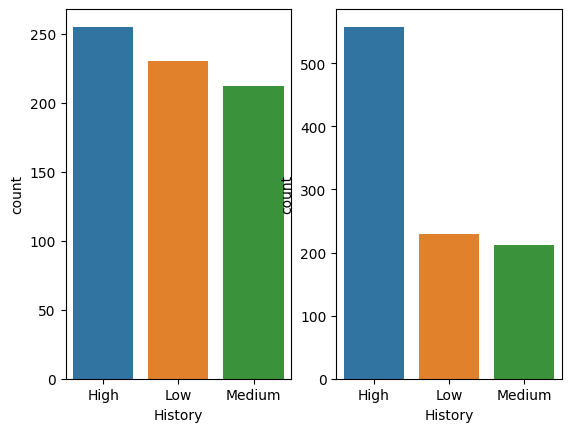

In [26]:
# Using matplotlib to tell python we need two side by side plots
fig, ax = plt.subplots(ncols = 2)

# Drawing two countplots, one for the History from dm, and the other for the History for imputed data
sns.countplot(dm["History"], ax = ax[0])
sns.countplot(dm_freq_impute["History"], ax = ax[1])

As can be clearly seen, there is a significant different between the two, as the most frequent Hisory entry was High, so we have just filled in 303 missing data with History. This can lead to severe inaccuracies in the models we will build and the analysis we will do, and so its better not to use this method, at least in the case where a lot of data is missing. Now we will try the other method, which looks at how the the all the data is distributed across bot the non missing values and the missing values, and then we will use that insight to plan on some manual imputation.

First we create two datasets - missing and non_missing

In [27]:
# Creating the dataset where all the missing History are there
dm_missing = dm[dm.isna().any(axis = 1)]

# Creating the dataset where none of the values are missing
dm_nonmissing = dm[dm["History"].isna() == False]

# Confriming our results
print(dm_missing.isna().sum())
print(dm_nonmissing.isna().sum())

Age              0
Gender           0
OwnHome          0
Married          0
Location         0
Salary           0
Children         0
History        303
Catalogs         0
AmountSpent      0
dtype: int64
Age            0
Gender         0
OwnHome        0
Married        0
Location       0
Salary         0
Children       0
History        0
Catalogs       0
AmountSpent    0
dtype: int64


Now lets look at how the numeric variables are distributed in the dataset

In [28]:
# Description of dm missing
print(dm_missing.describe())

# Description of dm non missing
print(dm_nonmissing.describe())

              Salary    Children    Catalogs  AmountSpent
count     303.000000  303.000000  303.000000   303.000000
mean    51616.501650    1.009901   13.702970  1239.900990
std     29984.845924    1.062563    6.565328   865.162353
min     10200.000000    0.000000    6.000000   106.000000
25%     23900.000000    0.000000    6.000000   521.000000
50%     48800.000000    1.000000   12.000000  1079.000000
75%     71200.000000    2.000000   18.000000  1636.500000
max    131500.000000    3.000000   24.000000  4984.000000
              Salary    Children    Catalogs  AmountSpent
count     697.000000  697.000000  697.000000   697.000000
mean    58054.662841    0.901004   15.107604  1206.714491
std     30703.954577    1.045082    6.607307  1000.321680
min     10100.000000    0.000000    6.000000    38.000000
25%     33200.000000    0.000000   12.000000   472.000000
50%     55200.000000    1.000000   12.000000   918.000000
75%     79900.000000    2.000000   18.000000  1702.000000
max    168800.

As we can see from the numeric summaries, both the sets do have similar numeric distributions, which indicates that numeric values will not be playing a major role in determing the History of the missing data. Next we see a summary of the non numeric values

/Users/muhammadsaqifulalam/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/muhammadsaqifulalam/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/muhammadsaqifulalam/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in a

<AxesSubplot:xlabel='Location', ylabel='count'>

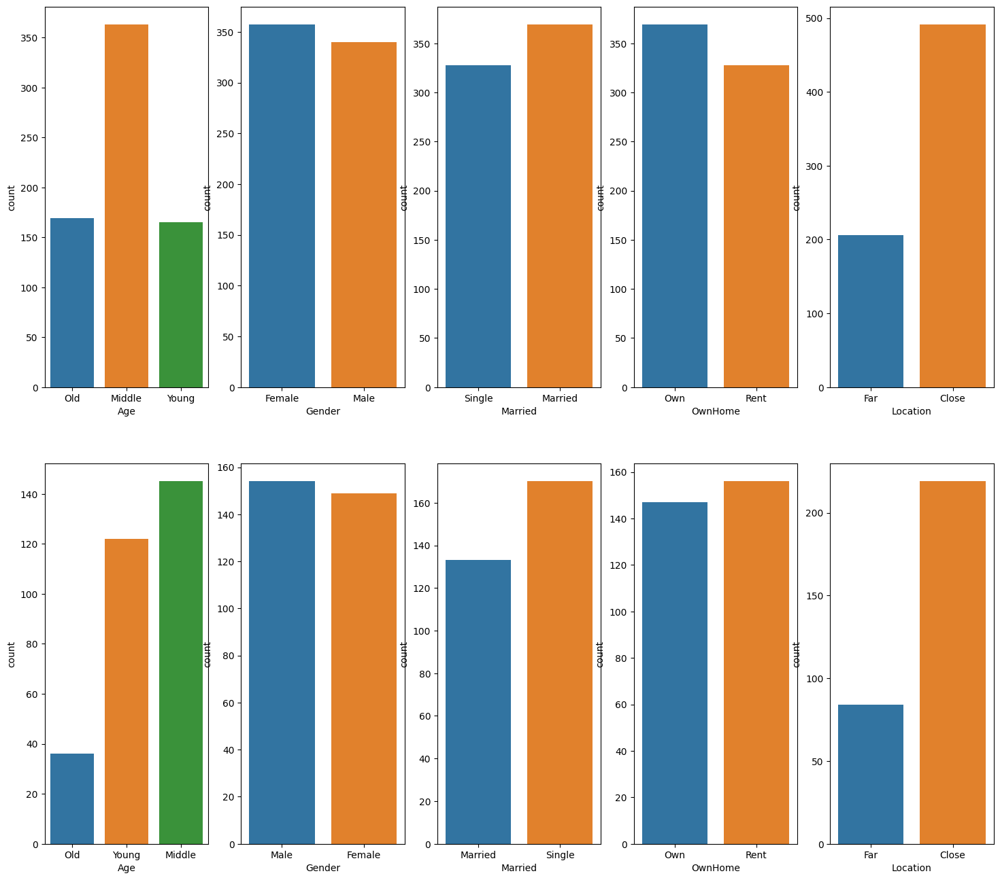

In [29]:
fig, ax = plt.subplots(2, 5, figsize = (18,16))

# Drawing the charts for non missing values
sns.countplot(dm_nonmissing["Age"], ax = ax[0,0])
sns.countplot(dm_nonmissing["Gender"], ax = ax[0,1])
sns.countplot(dm_nonmissing["Married"], ax = ax[0,2])
sns.countplot(dm_nonmissing["OwnHome"], ax = ax[0,3])
sns.countplot(dm_nonmissing["Location"], ax = ax[0,4])

# Drawing the charts for missing values
sns.countplot(dm_missing["Age"], ax = ax[1,0])
sns.countplot(dm_missing["Gender"], ax = ax[1,1])
sns.countplot(dm_missing["Married"], ax = ax[1,2])
sns.countplot(dm_missing["OwnHome"], ax = ax[1,3])
sns.countplot(dm_missing["Location"], ax = ax[1,4])


This collection of countplots make it very very clear that the main variable where there is a larget difference between those data that have History missing and those which have values in History is the Age variable. So lets zoom in on the age variable now

In [30]:
# % distribution of age in non missing data
print(dm_nonmissing["Age"].value_counts(normalize = True))

# Same for missing data
print(dm_missing["Age"].value_counts(normalize = True))

Middle    0.520803
Old       0.242468
Young     0.236729
Name: Age, dtype: float64
Middle    0.478548
Young     0.402640
Old       0.118812
Name: Age, dtype: float64


We can see that the age group that is predominantly missing is the Young group - that explains the high percentage of Young age group in the missing data. So now, lets see how, in the nonmissing data, Young age group's History is distributed

In [31]:
# To get a percentage distributon of history for each of the age groups
pd.crosstab(dm_nonmissing["Age"], dm_nonmissing["History"], normalize = "index")

History,High,Low,Medium
Age,,,
Middle,0.460055,0.190083,0.349862
Old,0.479290,0.224852,0.295858
Young,0.042424,0.745455,0.212121


So, for the Young Group the distribution of data is 4% High, 75% Low and 21% Medium. Now what we can do is randomly choose 4% of rows the missing data which have Young age group, and then replace the missing data with "High" history, do the same for 75% of the rows of Young age group in the missing data and replace them with "Low" history and so on.

In [32]:
# Getting the full length of the missing data of Young age group
print(len(dm_missing[dm_missing["Age"] == "Young"]))

# Getting the size of 4% of the data
print(len(dm_missing[dm_missing["Age"] == "Young"])* 0.04)

# Getting size of 75% of the data
print(len(dm_missing[dm_missing["Age"] == "Young"]) * 0.75)

# Getting the size of 21% of the data
print(len(dm_missing[dm_missing["Age"] == "Young"]) * 0.21)

122
4.88
91.5
25.619999999999997


This indicates that we will have 5 missing rows from the Young age group which we will replace by High History, 91 rows which we will replace by Low History, and 26 rows which we will replace by Medium History, and these rows will be chosen randomly

In [33]:
# Lets first get all the Young age rows in the missing dataset
dm_young = dm_missing[dm_missing["Age"] == "Young"]
print(len(dm_young))

# Next, get a sample of 5 rows from this dataset
dm_young_high = dm_young.sample(n = 5)

# And to store the rest of the data in a different dataset
dm_young_med_low = dm_young.drop(dm_young_high.index)
print(len(dm_young_med_low))

# Now scoping out the 91 rows for Medium History
dm_young_low = dm_young_med_low.sample(n = 91)

# And creating the last dataset only for the High values
dm_young_medium = dm_young_med_low.drop(dm_young_low.index)
print(len(dm_young_low))
print(len(dm_young_medium))

122
117
91
26


In [34]:
# Now we just put in the the missing values as High Medium and Low as per our ratio
dm_young_high["History"] = "High"
dm_young_low["History"] = "Low"
dm_young_medium["History"] = "Medium"

# And then join the three subsets to re-form the dm_young
dm_young = pd.concat([dm_young_high, dm_young_low, dm_young_medium])

# To check our work
print(dm_young.shape)
dm_young.head()

(122, 10)


,Age,Gender,OwnHome,Married,Location,Salary,Children,History,Catalogs,AmountSpent
327,Young,Male,Rent,Single,Close,20900,0,High,6,296
73,Young,Male,Rent,Single,Close,14400,0,High,24,615
653,Young,Male,Rent,Married,Far,55000,0,High,12,1162
803,Young,Male,Rent,Single,Close,17900,0,High,18,395
70,Young,Female,Rent,Single,Close,15600,0,High,12,468


In [35]:
# Now we would need to send replace the Young Age groups missing values of the dm_missing dataset with the new dm_young
# The easy approach will be to get the Old and Middle group from dm missing and merge with the new dm young

# Getting the Old and Middle Group
dm_old_middle = dm_missing[dm_missing["Age"] != "Young"]

# Creating a new dataset out of the missing values for Old and Middle but imputed values of Young
dm_some_missing = pd.concat([dm_young, dm_old_middle])

# Checking the number of nulls now
dm_some_missing.isna().sum()

Age              0
Gender           0
OwnHome          0
Married          0
Location         0
Salary           0
Children         0
History        181
Catalogs         0
AmountSpent      0
dtype: int64

So in this way, we have imputed 122 out of 303 null values, reducing the number of nulls to be 181. We can keep on doing the same for Old age group and then the Middle Age group, and get an estimated imputed dataset where History is not having any missing values.

One word of caution though. This approach is better than just imputing all the values with just a single value (just "High" in history), but it still adds some noise to the data, as we are still unaware of the real value and we are randomly guessing, albeit with some insights (so not completely random). There are other approaches, but beyond the scope of this notebook for now, where we can actually use machine learning models to make really accurate predictions of the missing data.

### Cleaning the notebook to have lesser data

At this point we ended up creating a lot of datasets and this might reduce the speed of our commands and slow down the notebook. Lets see if we can do something about that

In [36]:
# Lets start by seeing what we have so far
%whos

Variable                 Type             Data/Info
---------------------------------------------------
KNNImputer               type             <class 'sklearn.impute._knn.KNNImputer'>
ProfileReport            type             <class 'pandas_profiling.<...>le_report.ProfileReport'>
SimpleImputer            type             <class 'sklearn.impute._base.SimpleImputer'>
ax                       ndarray          2x5: 10 elems, type `object`, 80 bytes
dm                       DataFrame                Age  Gender OwnHo<...>n[1000 rows x 10 columns]
dm_freq_impute           DataFrame                Age  Gender OwnHo<...>n[1000 rows x 10 columns]
dm_missing               DataFrame                Age  Gender OwnHo<...>\n[303 rows x 10 columns]
dm_nonmissing            DataFrame                Age  Gender OwnHo<...>\n[697 rows x 10 columns]
dm_old_middle            DataFrame                Age  Gender OwnHo<...>\n[181 rows x 10 columns]
dm_some_missing          DataFrame                Age  Ge

In [37]:
# If we want to just look at the dataframe objects that are in the environment
%who_ls DataFrame

['dm',
 'dm_freq_impute',
 'dm_missing',
 'dm_nonmissing',
 'dm_old_middle',
 'dm_some_missing',
 'dm_young',
 'dm_young_high',
 'dm_young_low',
 'dm_young_med_low',
 'dm_young_medium',
 'loandata',
 'loandata_knn',
 'loandata_mean_impute',
 'loandata_median_impute',
 'loandata_mode_impute',
 'loandata_na_removed',
 'loandata_next_row',
 'loandata_num',
 'loandata_prev_row']

In [46]:
# Lets store this in a list and remove the loandata_knn, the KNN imputed dataset we have had with the duplicates removed
# For the rest of the file we will be working on this dataset

# Creating the list
datasets = %who_ls DataFrame

# Removing the loandata_knn
datasets.remove("loandata_knn")

# Checking the rest of the dataset names
datasets

['loandata',
 'loandata_mean_impute',
 'loandata_median_impute',
 'loandata_mode_impute',
 'loandata_na_removed',
 'loandata_next_row',
 'loandata_num',
 'loandata_prev_row']

In [47]:
# The next is to delete these datasets - which is actually a painfully manual work :(
del [ loandata,
 loandata_mean_impute,
 loandata_median_impute,
 loandata_mode_impute,
 loandata_na_removed,
 loandata_next_row,
 loandata_num,
 loandata_prev_row]

In [48]:
# To check whether this helped us clean the environment
whos

Variable              Type             Data/Info
------------------------------------------------
KNNImputer            type             <class 'sklearn.impute._knn.KNNImputer'>
ProfileReport         type             <class 'pandas_profiling.<...>le_report.ProfileReport'>
SimpleImputer         type             <class 'sklearn.impute._base.SimpleImputer'>
ax                    ndarray          2x5: 10 elems, type `object`, 80 bytes
datasets              list             n=8
fig                   Figure           Figure(1800x1600)
imputer               KNNImputer       KNNImputer()
loandata_knn          DataFrame               person_age  person<...>[32416 rows x 12 columns]
non_numeric_imputer   SimpleImputer    SimpleImputer(strategy='most_frequent')
np                    module           <module 'numpy' from '/Us<...>kages/numpy/__init__.py'>
pd                    module           <module 'pandas' from '/U<...>ages/pandas/__init__.py'>
plt                   module           <module 'm